In [1]:
!pip install scFates

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Attempting uninstall: python-igraph
    Found existing installation: python-igraph 0.10.2
    Uninstalling python-igraph-0.10.2:
      Successfully uninstalled python-igraph-0.10.2

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import sys
!{sys.executable} -m pip -q install palantir fa2


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [3]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [4]:
adata = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D59_fetal_filtered_gene_bc_matrices/GRCh38/", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D59_fetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [5]:
adata2 = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D125Pfetal_filtered_gene_bc_matrices/GRCh38/", cache = True)


... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D125Pfetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [6]:
adata1 = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D125Cfetal_filtered_gene_bc_matrices/GRCh38/", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D125Cfetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [7]:
adata3 = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D82Cfetal_filtered_gene_bc_matrices/GRCh38/", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D82Cfetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [8]:
adata4 = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D82Pfetal_filtered_gene_bc_matrices/GRCh38/", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D82Pfetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [9]:
adata.obs['stage'] = 'FD59'

In [10]:
adata1.obs['stage'] = 'FD125'
adata2.obs['stage'] = 'FD125'
adata3.obs['stage'] = 'FD82'
adata4.obs['stage'] = 'FD82'

In [13]:
adata.obs_names_make_unique()

In [14]:
adata.obs_names_make_unique()
adata1.obs_names_make_unique()
adata2.obs_names_make_unique()
adata3.obs_names_make_unique()
adata4.obs_names_make_unique()

In [15]:
adataall = AnnData.concatenate(adata, adata1, adata2, adata3, adata4)

In [16]:
adataall.obs

,stage,batch
AAACATACGAGGCA-1-0,FD59,0
AAACATACTTCCAT-1-0,FD59,0
AAACATACTTTCAC-1-0,FD59,0
AAACATTGACCTGA-1-0,FD59,0
AAACCGTGAGAACA-1-0,FD59,0
...,...,...
TTTAGGCTTGCCTC-1-4,FD82,4
TTTAGGCTTTGACG-1-4,FD82,4
TTTATCCTTGCTCC-1-4,FD82,4
TTTCAGTGGCTTAG-1-4,FD82,4


In [17]:
adata = adataall

In [18]:
sc.pp.filter_genes(adata,min_cells=1)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata,base=10)
sc.pp.highly_variable_genes(adata)

filtered out 9430 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [19]:
sc.pp.highly_variable_genes(adata, n_top_genes=3000)
sc.pp.pca(adata)
pca_projections = pd.DataFrame(adata.obsm["X_pca"],index=adata.obs_names)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


In [20]:
pca_projections = pd.DataFrame(adata.obsm["X_pca"],index=adata.obs_names)

In [21]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:30)


In [22]:
# generate neighbor draph in multiscale diffusion space
adata.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adata,n_neighbors=30,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


In [23]:
# draw ForceAtlas2 embedding using 2 first PCs as initial positions
adata.obsm["X_pca2d"]=adata.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adata,init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:09:12)


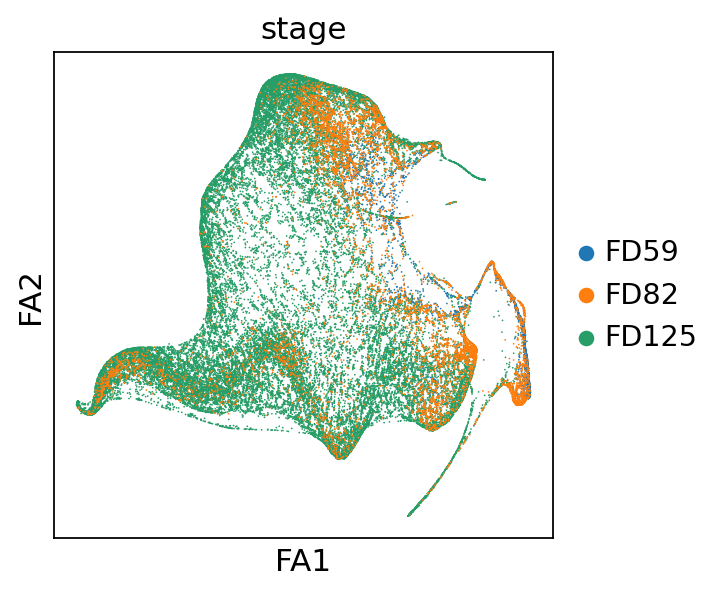

In [24]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=['stage'])

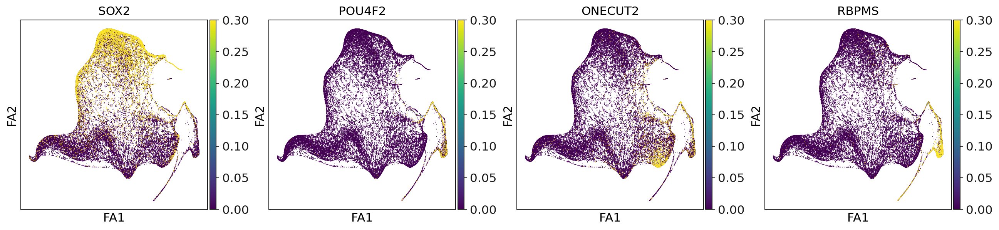

In [25]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=["SOX2",'POU4F2','ONECUT2','RBPMS'], vmax = 0.3)

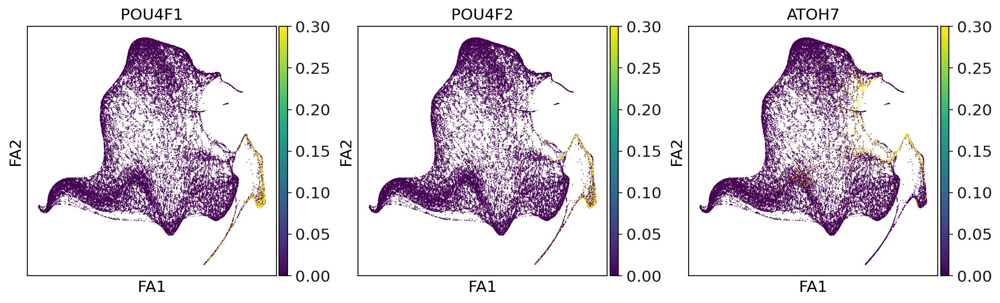

In [28]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=['POU4F1','POU4F2','ATOH7'], vmax = 0.3)

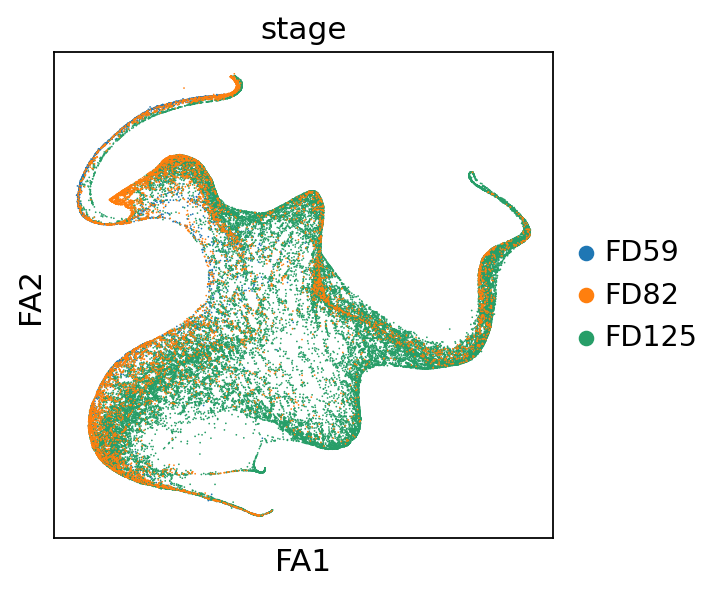

In [134]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=['stage'],color_map="RdBu_r")

In [29]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 52 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:14)


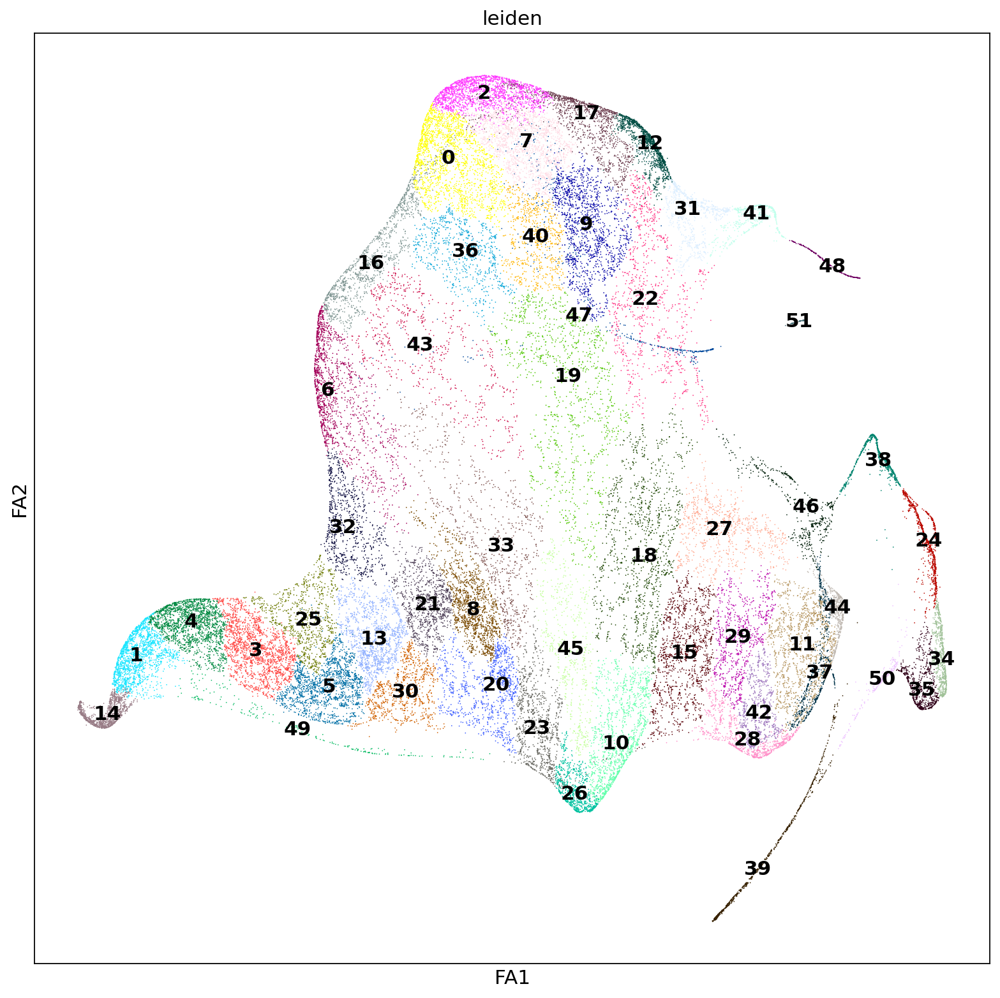

In [31]:
sc.set_figure_params(figsize = (12,12))
sc.pl.draw_graph(adata,color=["leiden"], legend_loc = 'on data')

In [32]:
adatasubset = adata[adata.obs['leiden'].isin(['46','38','24','34','35','50','39','22'])]

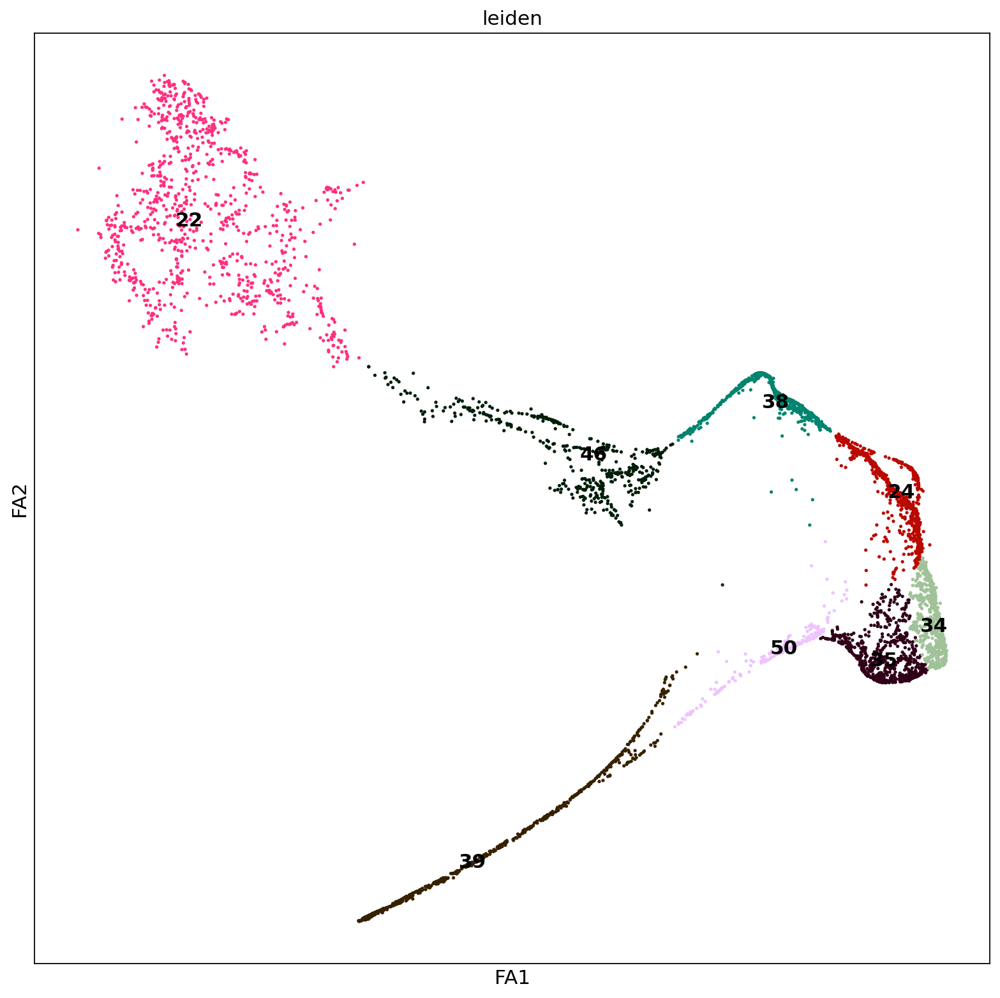

In [33]:
sc.pl.draw_graph(adatasubset,color=["leiden"], legend_loc = 'on data')

In [34]:
sc.pp.pca(adatasubset)
pca_projections = pd.DataFrame(adatasubset.obsm["X_pca"],index=adatasubset.obs_names)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


In [35]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset,n_neighbors=30,use_rep="X_palantir")

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [36]:
adatasubset.obsm["X_pca2d"]=adatasubset.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset,init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:33)


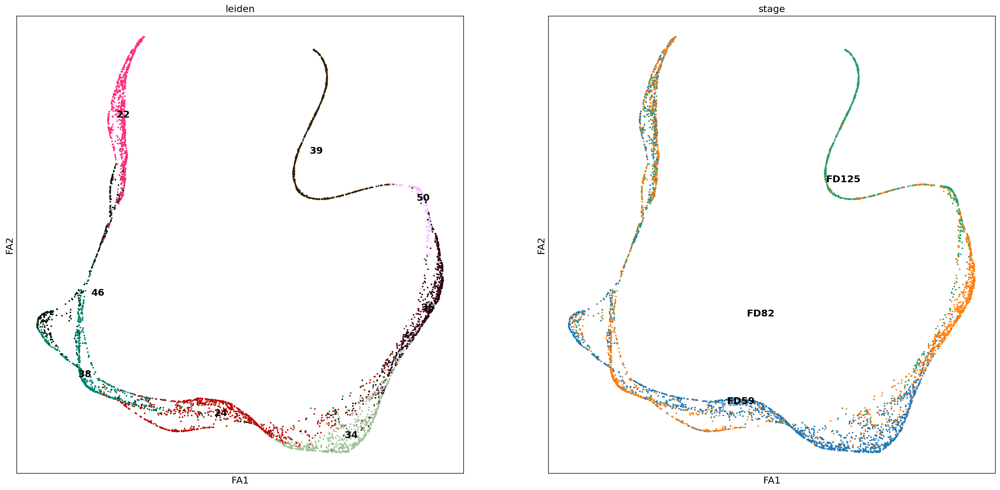

In [37]:
sc.pl.draw_graph(adatasubset,color=["leiden",'stage'], legend_loc = 'on data')

In [38]:
def cluster_small_multiples(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.draw_graph(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )

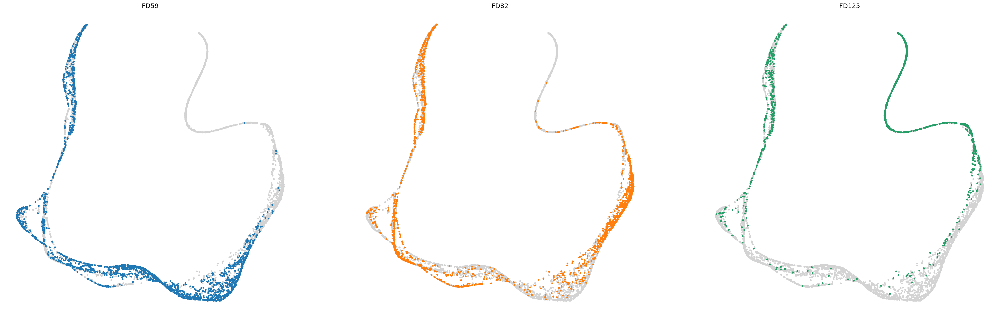

In [39]:
cluster_small_multiples(adatasubset, clust_key = 'stage')

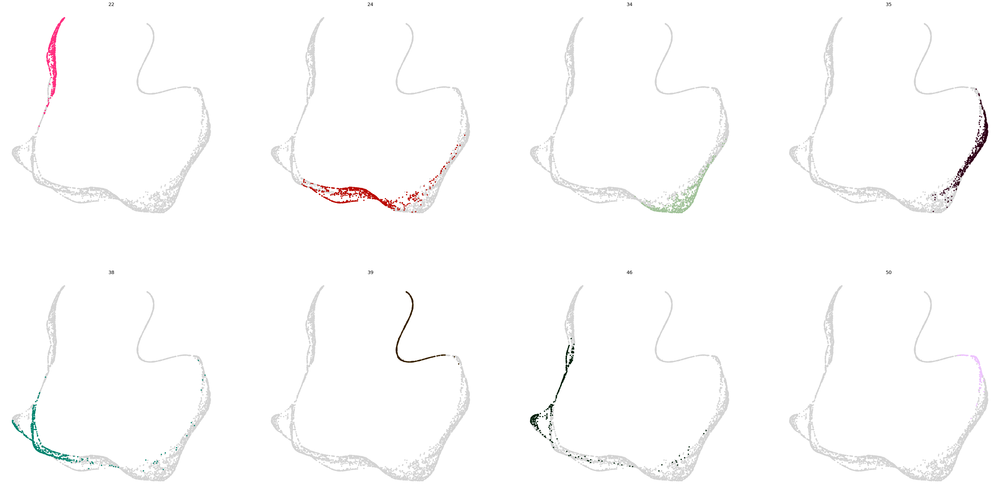

In [40]:
cluster_small_multiples(adatasubset, clust_key = 'leiden')

In [41]:
adatasubset.var

,gene_ids,n_cells,highly_variable,means,dispersions,dispersions_norm
RP11-34P13.3,ENSG00000243485,1,False,0.000058,1.073665,-0.634328
RP11-34P13.7,ENSG00000238009,12,False,0.000595,1.622207,0.207075
RP11-34P13.8,ENSG00000239945,1,False,0.000126,1.849443,0.555630
FO538757.2,ENSG00000279457,1428,False,0.074395,1.655837,0.258661
AP006222.2,ENSG00000228463,880,False,0.043807,1.656939,0.260351
...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,191,False,0.007115,1.420795,-0.101868
AC007325.2,ENSG00000277196,1,False,0.000031,0.456944,-1.580310
AL354822.1,ENSG00000278384,11,False,0.000551,1.237476,-0.383060
AC004556.1,ENSG00000276345,4,False,0.000186,1.161470,-0.499645


In [42]:
adatasubset_old = sc.read_h5ad('/mnt/c/Users/Emil/10X/scretina/adatasubset.h5ad')

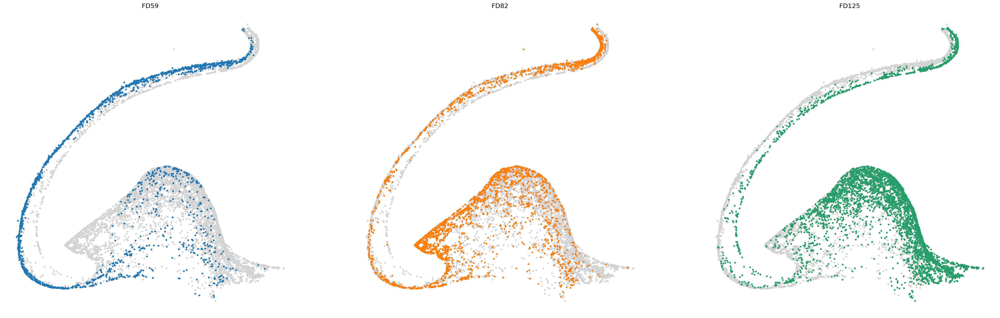

In [43]:
cluster_small_multiples(adatasubset_old, clust_key = 'stage')

In [44]:
adatasubset_old.var

,gene_ids,stage-1,stage-2,stage-3,stage-4,n_cells,highly_variable,means,dispersions,dispersions_norm
RP11-34P13.3,ENSG00000243485,FD125,FD125,FD82,FD82,1,False,0.000012,0.593960,1.344147
RP11-34P13.7,ENSG00000238009,FD125,FD125,FD82,FD82,12,False,0.000107,0.621599,0.242403
RP11-34P13.8,ENSG00000239945,FD125,FD125,FD82,FD82,1,True,0.000017,0.866658,2.807348
FO538757.2,ENSG00000279457,FD125,FD125,FD82,FD82,1428,False,0.013719,0.614714,-1.106546
AP006222.2,ENSG00000228463,FD125,FD125,FD82,FD82,880,False,0.008033,0.608885,-1.019663
...,...,...,...,...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,FD125,FD125,FD82,FD82,191,False,0.001455,0.531235,-1.677975
AC007325.2,ENSG00000277196,FD125,FD125,FD82,FD82,1,False,0.000008,0.411492,0.365092
AL354822.1,ENSG00000278384,FD125,FD125,FD82,FD82,11,False,0.000111,0.575987,-0.173916
AC004556.1,ENSG00000276345,FD125,FD125,FD82,FD82,4,False,0.000038,0.571934,0.054530


In [45]:
sc.tl.score_genes(adatasubset_old, gene_list = ['ACAP3','ADGRG1','ADGRL3','ALKBH1','ARHGEF2','ARX','ASCL1','ASPM',
                                            'ASTN1','ASTN2','ATOH1','AUTS2','AXL','BARHL1','BARHL2','BAX','BBS1',
'BBS4','CAMK2A','CAMK2B','CCK','CCKAR','CCR4','CDK5','CDK5R1','CDK5R2','CDKL5','CELSR1','CELSR2','CEP85L','CHL1',
'CNTN2','COL3A1','CRK','CRKL','CTNNA2','CTNNB1','CX3CL1','CXCL12','CXCR4','DAB1','DAB2IP','DCC','DCDC2','DCLK1','DCX',
'DDIT4','DISC1','DNAAF4','DNER','DRD1','DRD2','DRGX','ELP3','EMX2','EOMES','EVX1','FAT3','FBXO31','FBXO45','FEZF1',
'FEZF2','FGF13','FGFR1','FLRT2','FOXG1','FYN','FZD3','GAS6','GATA2','GATA3','GFRA3','GNRH1','GPM6A','GPR173',
'HSP90AA1','IGSF10','ITGA3','KIAA0319','KIAA0319L','KIF20B','KIRREL3','LHX1','LHX6','LRIG2','LRP12','MAP1B',
'MARK1','MARK2','MDGA1','MDK','MEF2C','NAV1','NDE1','NDEL1','NDN','NDNF','NEO1','NEUROD4','NEXMIF','NIPBL',
'NKX2-1','NKX6-1','NR2F2','NR4A2','NRCAM','NRG1','NRG3','NRP1','NRP2','NSMF','NTN1','NTNG1','NTNG2','NTRK2','NTRK3',
'OLIG3','PAFAH1B1','PAX6','PCM1','PEX13','PEX5','PEX7','PHACTR1','PHOX2B','PLAA','PLXNA1','PLXNA3','PLXNB2','POMGNT2',
'POU4F1','PRKG1','PSEN1','RAC1','RAPGEF2','RELN','RHOA','SATB2','SCRT1','SCRT2','SDCCAG8','SEMA3A','SEMA3E',
'SEMA6A','SEPTIN14','SEPTIN4','SH3RF1','SHTN1','SOX1','SOX14','SPOCK1','SRF','SRGAP2','SRGAP2C','STAT3','TBC1D24',
'TBX20','TLX3','TNN','TOP2B','TRIM46','TUBB2A','TUBB2B','TUBGCP2','TWIST1','TYRO3','ULK4','UNC5C','UNC5D','UNK',
                                        'USP9X','VAX1','VEGFA','WDR62','YWHAE','ZMIZ1','ZNF609'], score_name = 'GOBP_NEURON_MIGRATION')

computing score 'GOBP_NEURON_MIGRATION'
    finished: added
    'GOBP_NEURON_MIGRATION', score of gene set (adata.obs).
    1043 total control genes are used. (0:00:00)


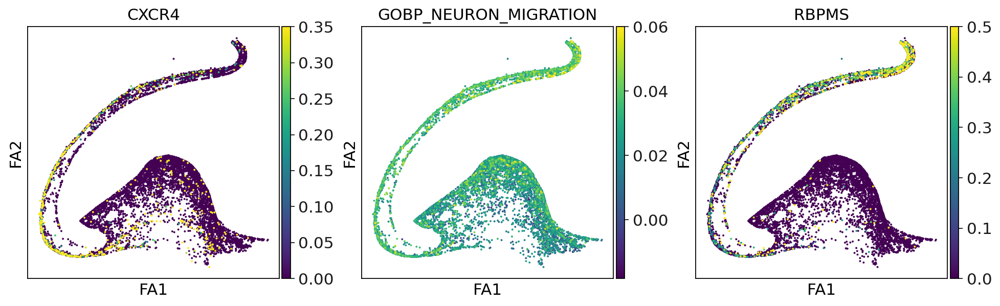

In [53]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset_old,color=["CXCR4",'GOBP_NEURON_MIGRATION','RBPMS'], legend_loc = 'on data', vmax = [0.35,0.06,0.5])

In [54]:
adatasubset_old_reclustered = adatasubset_old

In [55]:
sc.pp.pca(adatasubset_old_reclustered)
pca_projections = pd.DataFrame(adatasubset_old_reclustered.obsm["X_pca"],index=adatasubset_old_reclustered.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset_old_reclustered.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset_old_reclustered,n_neighbors=30,use_rep="X_palantir")
adatasubset_old_reclustered.obsm["X_pca2d"]=adatasubset_old_reclustered.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset_old_reclustered,init_pos='X_pca2d')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:01:12)


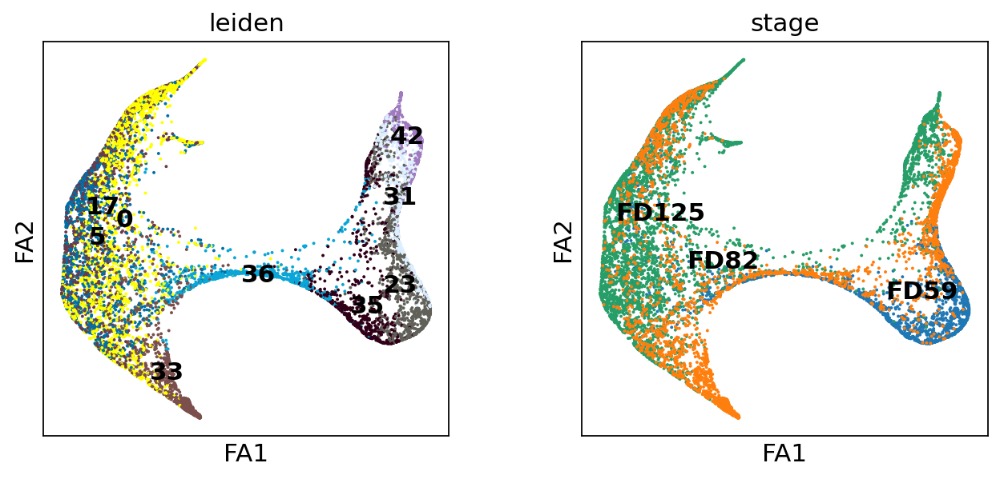

In [56]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=["leiden",'stage'], legend_loc = 'on data')

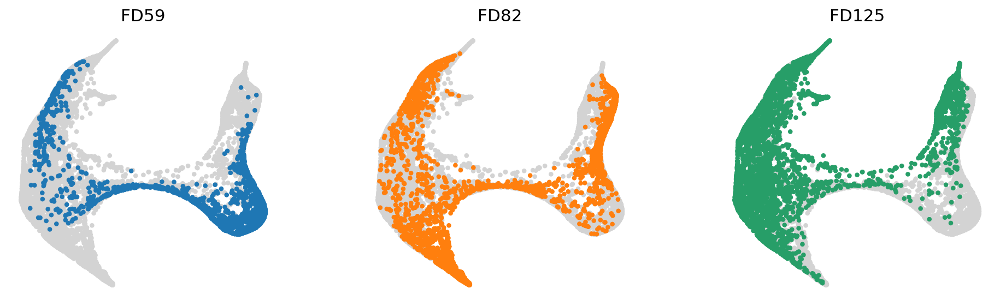

In [57]:
cluster_small_multiples(adatasubset_old_reclustered, clust_key = 'stage')

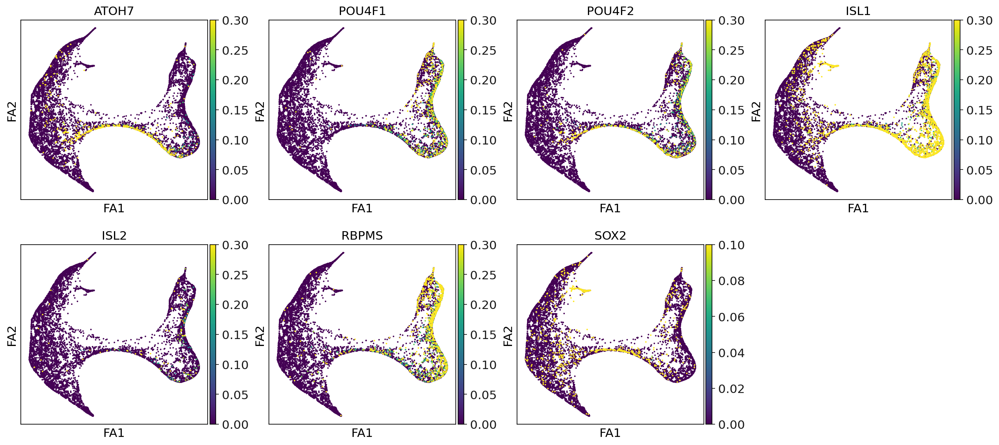

In [61]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.3,0.1])

In [62]:
sc.tl.leiden(adatasubset_old_reclustered)

running Leiden clustering
    finished: found 31 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


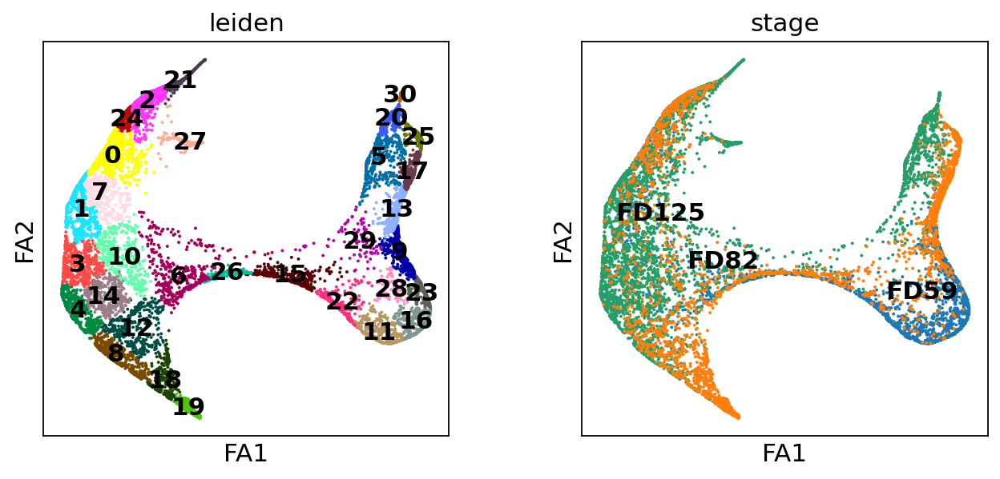

In [63]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=["leiden",'stage'], legend_loc = 'on data')

In [64]:
adatasubset_old_reclustered = adatasubset_old_reclustered[adatasubset_old_reclustered.obs['leiden'].isin(['30','20','25','5','17','13','9','28','29','23','16','11','22','15','26','6','12','14','10','7','0','24','2'])]

In [65]:
sc.pp.pca(adatasubset_old_reclustered)
pca_projections = pd.DataFrame(adatasubset_old_reclustered.obsm["X_pca"],index=adatasubset_old_reclustered.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset_old_reclustered.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset_old_reclustered,n_neighbors=30,use_rep="X_palantir")
adatasubset_old_reclustered.obsm["X_pca2d"]=adatasubset_old_reclustered.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset_old_reclustered,init_pos='X_pca2d')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:46)


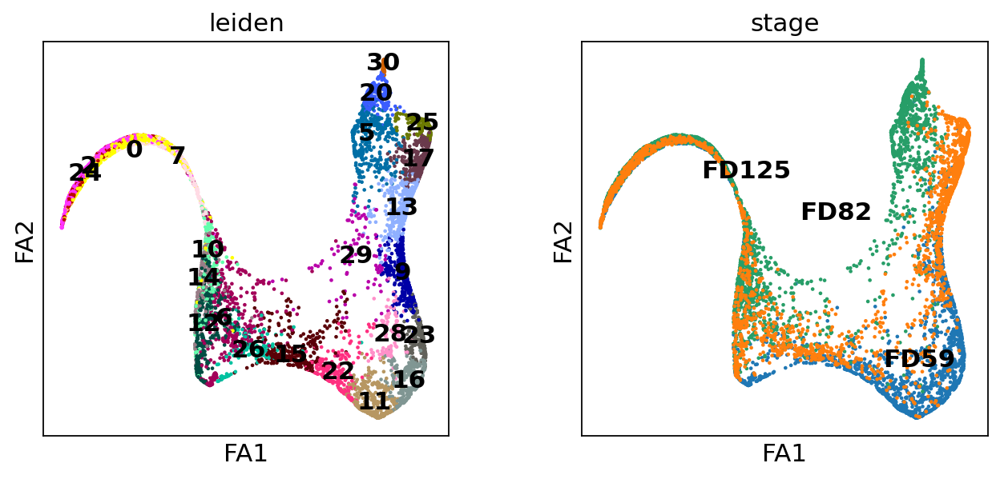

In [66]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=["leiden",'stage'], legend_loc = 'on data')

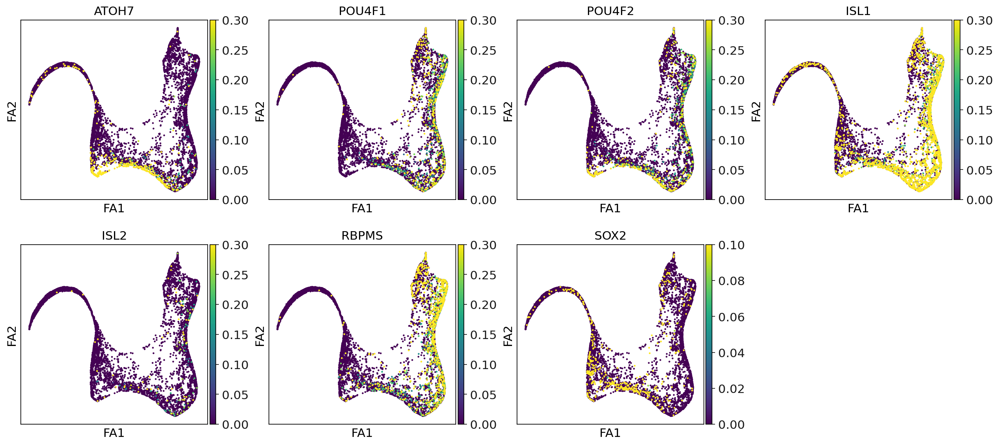

In [67]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.3,0.1])

In [68]:
adatasubset_old_reclustered = adatasubset_old_reclustered[adatasubset_old_reclustered.obs['leiden'].isin(['30','20','25','5','17','13','9','28','29','23','16','11','22','15','26','6','12','14','10'])]

In [69]:
sc.pp.pca(adatasubset_old_reclustered)
pca_projections = pd.DataFrame(adatasubset_old_reclustered.obsm["X_pca"],index=adatasubset_old_reclustered.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset_old_reclustered.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset_old_reclustered,n_neighbors=30,use_rep="X_palantir")
adatasubset_old_reclustered.obsm["X_pca2d"]=adatasubset_old_reclustered.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset_old_reclustered,init_pos='X_pca2d')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:33)


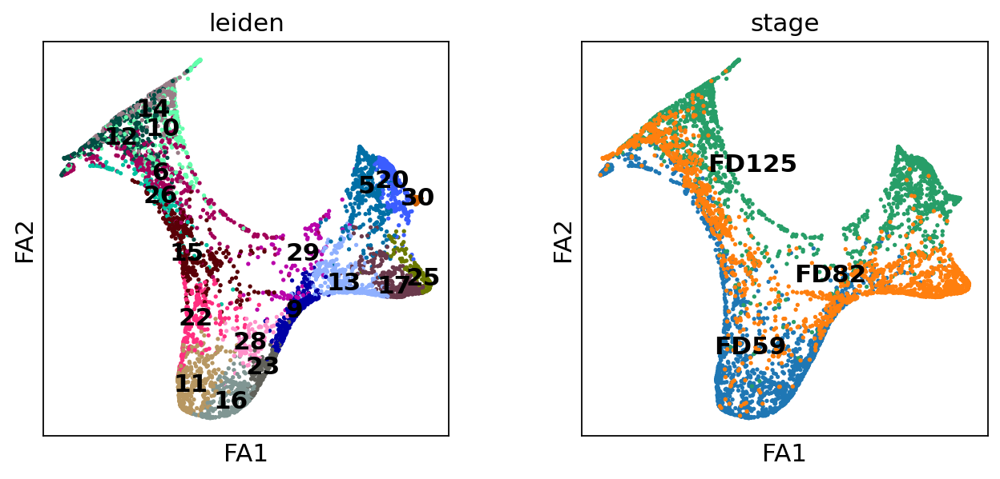

In [70]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=["leiden",'stage'], legend_loc = 'on data')

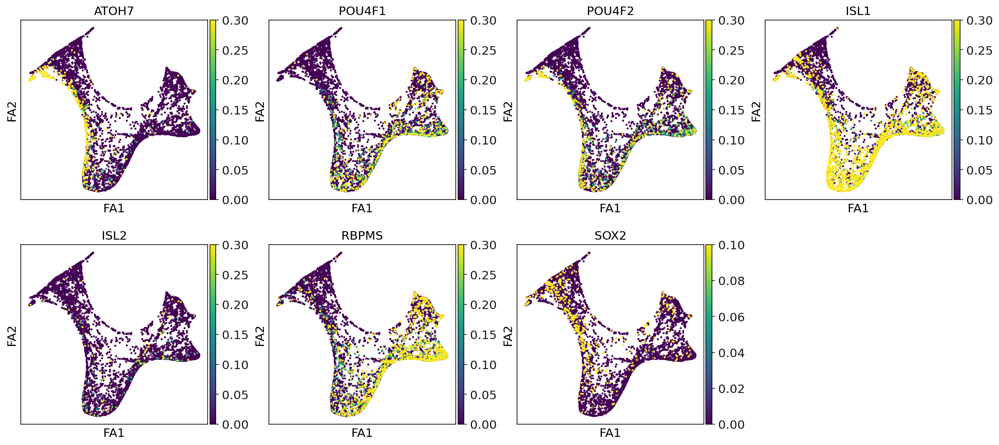

In [71]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.3,0.1])

In [72]:
adatasubset_old_reclustered = adatasubset_old_reclustered[adatasubset_old_reclustered.obs['leiden'].isin(['30','20','25','5','17','13','9','28','29','23','16','11','22','15','26'])]

In [73]:
sc.pp.pca(adatasubset_old_reclustered)
pca_projections = pd.DataFrame(adatasubset_old_reclustered.obsm["X_pca"],index=adatasubset_old_reclustered.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset_old_reclustered.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset_old_reclustered,n_neighbors=30,use_rep="X_palantir")
adatasubset_old_reclustered.obsm["X_pca2d"]=adatasubset_old_reclustered.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset_old_reclustered,init_pos='X_pca2d')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:22)


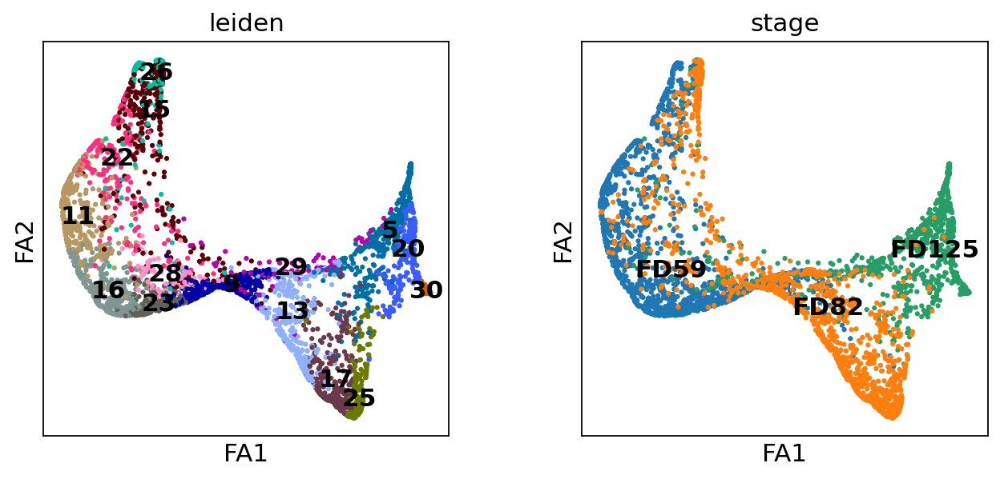

In [74]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=["leiden",'stage'], legend_loc = 'on data')

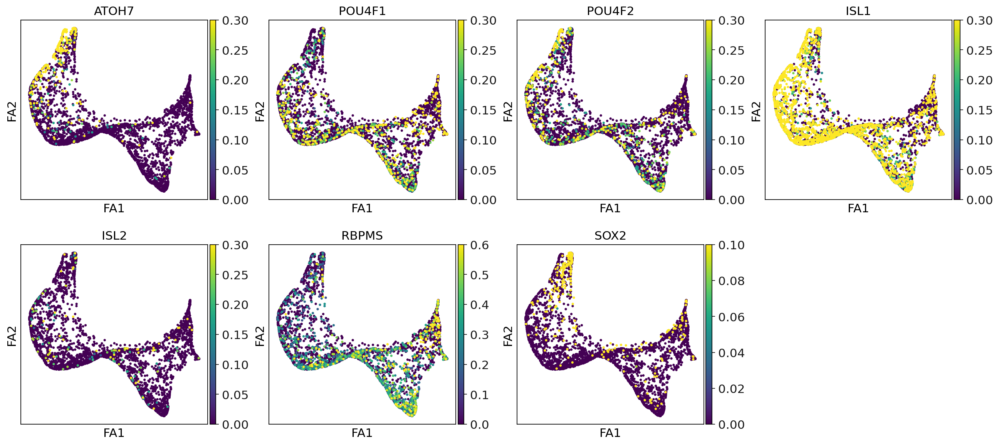

In [76]:
sc.pl.draw_graph(adatasubset_old_reclustered,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.6,0.1])

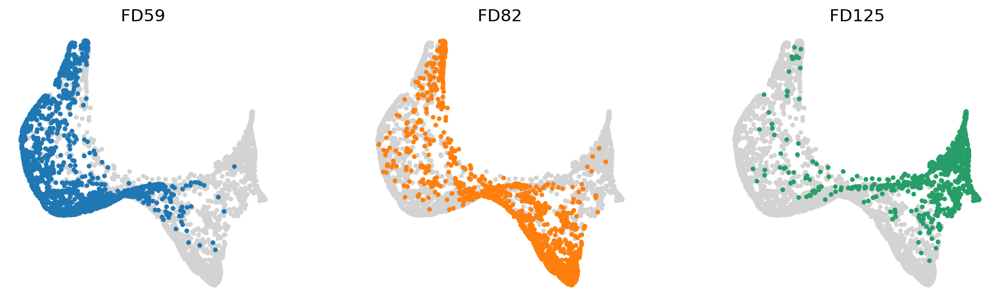

In [77]:
cluster_small_multiples(adatasubset_old_reclustered, clust_key = 'stage')

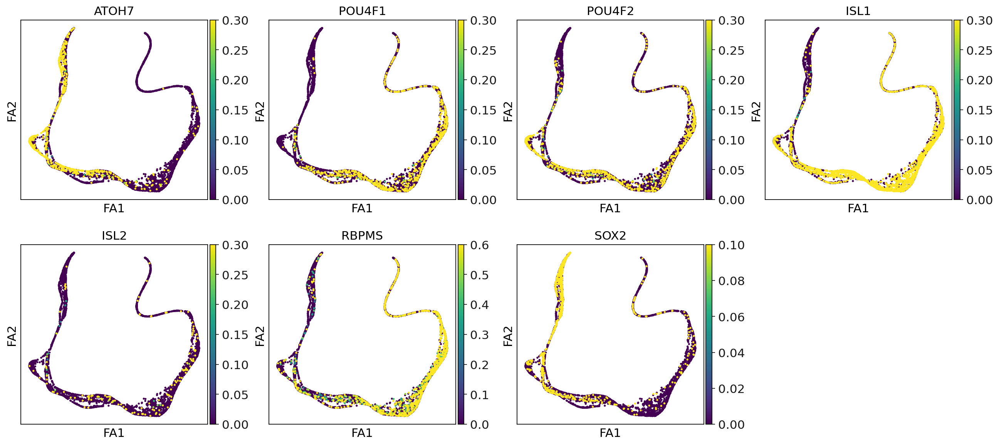

In [78]:
sc.pl.draw_graph(adatasubset,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.6,0.1])

In [79]:
sc.tl.score_genes(adatasubset, gene_list = ['ACAP3','ADGRG1','ADGRL3','ALKBH1','ARHGEF2','ARX','ASCL1','ASPM',
                                            'ASTN1','ASTN2','ATOH1','AUTS2','AXL','BARHL1','BARHL2','BAX','BBS1',
'BBS4','CAMK2A','CAMK2B','CCK','CCKAR','CCR4','CDK5','CDK5R1','CDK5R2','CDKL5','CELSR1','CELSR2','CEP85L','CHL1',
'CNTN2','COL3A1','CRK','CRKL','CTNNA2','CTNNB1','CX3CL1','CXCL12','CXCR4','DAB1','DAB2IP','DCC','DCDC2','DCLK1','DCX',
'DDIT4','DISC1','DNAAF4','DNER','DRD1','DRD2','DRGX','ELP3','EMX2','EOMES','EVX1','FAT3','FBXO31','FBXO45','FEZF1',
'FEZF2','FGF13','FGFR1','FLRT2','FOXG1','FYN','FZD3','GAS6','GATA2','GATA3','GFRA3','GNRH1','GPM6A','GPR173',
'HSP90AA1','IGSF10','ITGA3','KIAA0319','KIAA0319L','KIF20B','KIRREL3','LHX1','LHX6','LRIG2','LRP12','MAP1B',
'MARK1','MARK2','MDGA1','MDK','MEF2C','NAV1','NDE1','NDEL1','NDN','NDNF','NEO1','NEUROD4','NEXMIF','NIPBL',
'NKX2-1','NKX6-1','NR2F2','NR4A2','NRCAM','NRG1','NRG3','NRP1','NRP2','NSMF','NTN1','NTNG1','NTNG2','NTRK2','NTRK3',
'OLIG3','PAFAH1B1','PAX6','PCM1','PEX13','PEX5','PEX7','PHACTR1','PHOX2B','PLAA','PLXNA1','PLXNA3','PLXNB2','POMGNT2',
'POU4F1','PRKG1','PSEN1','RAC1','RAPGEF2','RELN','RHOA','SATB2','SCRT1','SCRT2','SDCCAG8','SEMA3A','SEMA3E',
'SEMA6A','SEPTIN14','SEPTIN4','SH3RF1','SHTN1','SOX1','SOX14','SPOCK1','SRF','SRGAP2','SRGAP2C','STAT3','TBC1D24',
'TBX20','TLX3','TNN','TOP2B','TRIM46','TUBB2A','TUBB2B','TUBGCP2','TWIST1','TYRO3','ULK4','UNC5C','UNC5D','UNK',
                                        'USP9X','VAX1','VEGFA','WDR62','YWHAE','ZMIZ1','ZNF609'], score_name = 'GOBP_NEURON_MIGRATION')

computing score 'GOBP_NEURON_MIGRATION'
    finished: added
    'GOBP_NEURON_MIGRATION', score of gene set (adata.obs).
    1095 total control genes are used. (0:00:00)


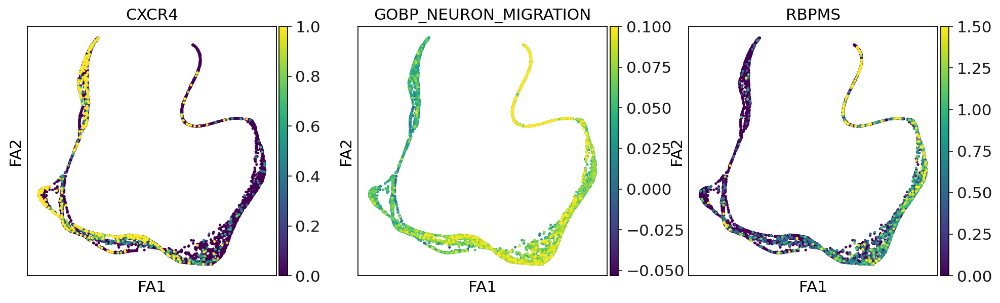

In [82]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=["CXCR4",'GOBP_NEURON_MIGRATION','RBPMS'], vmax = [1,0.1,1.5], legend_loc = 'on data')

In [84]:
from matplotlib.pyplot import rc_context

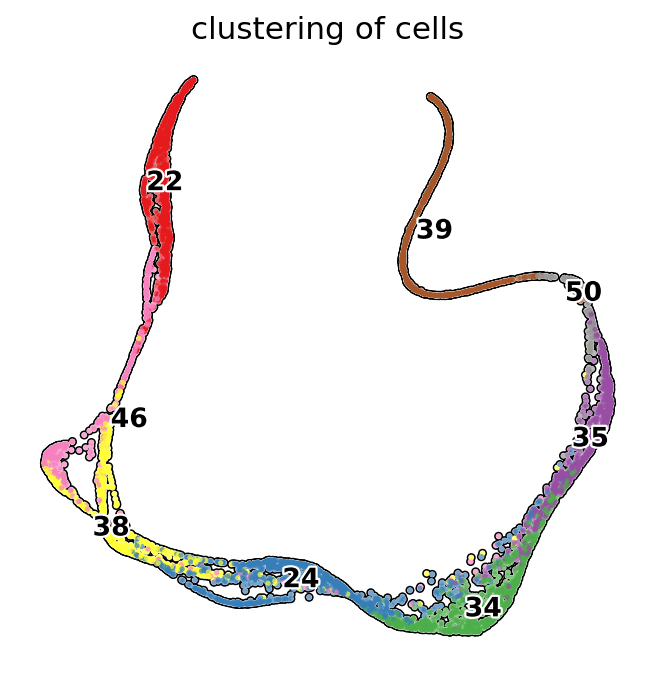

In [86]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.draw_graph(adatasubset, color='leiden', add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette='Set1')

In [92]:
adatasubset.var

,gene_ids,n_cells,highly_variable,means,dispersions,dispersions_norm
RP11-34P13.3,ENSG00000243485,1,False,0.000058,1.073665,-0.634328
RP11-34P13.7,ENSG00000238009,12,False,0.000595,1.622207,0.207075
RP11-34P13.8,ENSG00000239945,1,False,0.000126,1.849443,0.555630
FO538757.2,ENSG00000279457,1428,False,0.074395,1.655837,0.258661
AP006222.2,ENSG00000228463,880,False,0.043807,1.656939,0.260351
...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,191,False,0.007115,1.420795,-0.101868
AC007325.2,ENSG00000277196,1,False,0.000031,0.456944,-1.580310
AL354822.1,ENSG00000278384,11,False,0.000551,1.237476,-0.383060
AC004556.1,ENSG00000276345,4,False,0.000186,1.161470,-0.499645


In [155]:
adatasubset.obs

,stage,batch,leiden,GOBP_NEURON_MIGRATION,labels_CXCR4
AAACATACTTCCAT-1-0,FD59,0,38,0.054293,Low CXCR4
AAACATACTTTCAC-1-0,FD59,0,38,0.018805,Low CXCR4
AAACATTGACCTGA-1-0,FD59,0,24,0.062152,Low CXCR4
AAACGCACCCGTAA-1-0,FD59,0,34,0.040064,Low CXCR4
AAACGCACGAGGAC-1-0,FD59,0,34,0.046655,Low CXCR4
...,...,...,...,...,...
TTGGAGACTCCGAA-1-4,FD82,4,38,-0.000618,High CXCR4
TTGGGAACGTCAAC-1-4,FD82,4,46,0.039409,High CXCR4
TTTAGGCTTAACCG-1-4,FD82,4,38,0.036387,High CXCR4
TTTAGGCTTGCCTC-1-4,FD82,4,38,0.034797,High CXCR4


In [99]:
CXCR4 = sc.get.obs_df(adatasubset, keys = ['CXCR4'])

In [156]:
GOBP_migration = sc.get.obs_df(adatasubset, keys = ['GOBP_NEURON_MIGRATION'])

In [100]:
CXCR4

,CXCR4
AAACATACTTCCAT-1-0,0.000000
AAACATACTTTCAC-1-0,0.000000
AAACATTGACCTGA-1-0,1.190055
AAACGCACCCGTAA-1-0,0.000000
AAACGCACGAGGAC-1-0,0.000000
...,...
TTGGAGACTCCGAA-1-4,0.000000
TTGGGAACGTCAAC-1-4,0.173712
TTTAGGCTTAACCG-1-4,0.000000
TTTAGGCTTGCCTC-1-4,0.000000


(array([4.287e+03, 2.090e+02, 2.450e+02, 1.760e+02, 1.400e+02, 8.200e+01,
        6.600e+01, 3.800e+01, 1.600e+01, 2.000e+01, 2.000e+00, 3.000e+00,
        6.000e+00, 4.000e+00, 3.000e+00]),
 array([0.        , 0.25361615, 0.5072323 , 0.76084846, 1.0144646 ,
        1.2680808 , 1.5216969 , 1.7753131 , 2.0289292 , 2.2825453 ,
        2.5361617 , 2.7897778 , 3.0433939 , 3.29701   , 3.5506263 ,
        3.8042424 ], dtype=float32),
 <BarContainer object of 15 artists>)

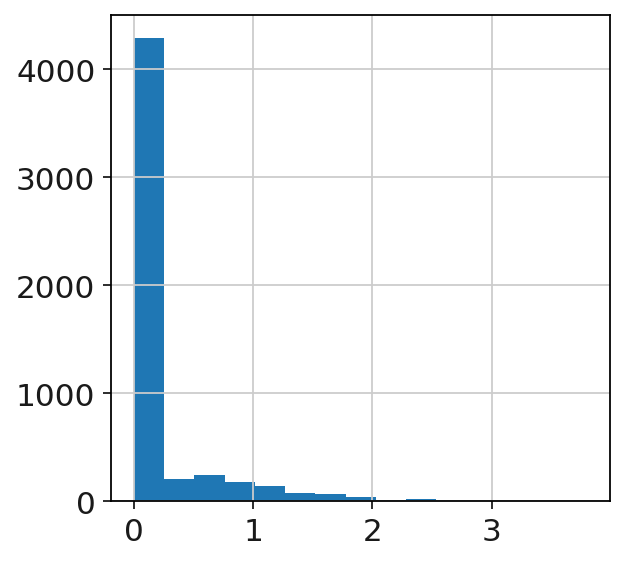

In [107]:
plt.hist(CXCR4, bins = 15)

(array([   6.,   36.,  146.,  325.,  568.,  857., 1129., 1090.,  711.,
         275.,  105.,   27.,   16.,    3.,    3.]),
 array([-0.05329433, -0.03760926, -0.02192419, -0.00623912,  0.00944595,
         0.02513102,  0.04081609,  0.05650116,  0.07218623,  0.0878713 ,
         0.10355637,  0.11924144,  0.13492651,  0.15061158,  0.16629664,
         0.18198171]),
 <BarContainer object of 15 artists>)

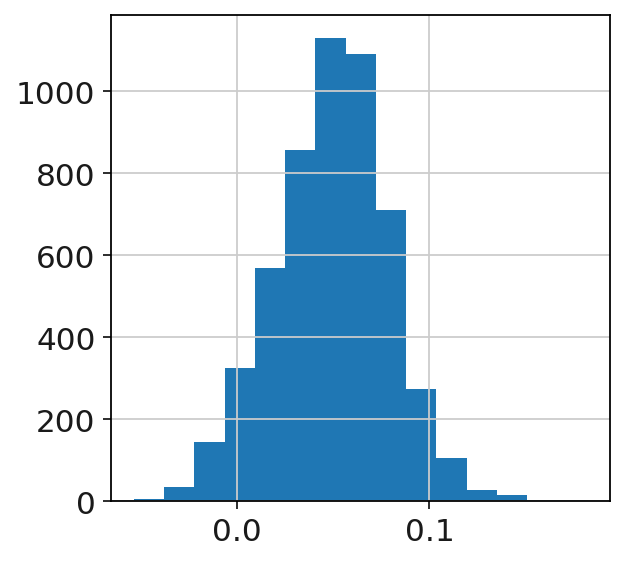

In [158]:
plt.hist(GOBP_migration, bins = 15)

In [110]:
import statistics

In [118]:
statistics.mean(CXCR4['CXCR4'])

0.18753779036595458

In [120]:
max(CXCR4['CXCR4'])

3.8042423725128174

In [121]:
min(CXCR4['CXCR4'])

0.0

In [159]:
GOBP_migration

,GOBP_NEURON_MIGRATION
AAACATACTTCCAT-1-0,0.054293
AAACATACTTTCAC-1-0,0.018805
AAACATTGACCTGA-1-0,0.062152
AAACGCACCCGTAA-1-0,0.040064
AAACGCACGAGGAC-1-0,0.046655
...,...
TTGGAGACTCCGAA-1-4,-0.000618
TTGGGAACGTCAAC-1-4,0.039409
TTTAGGCTTAACCG-1-4,0.036387
TTTAGGCTTGCCTC-1-4,0.034797


In [178]:
CXCR4 = CXCR4.sort_values(by = 'CXCR4')

In [179]:
CXCR4

,CXCR4,label
AAACATACTTCCAT-1-0,0.000000,Low CXCR4
GGCTCACTCCGATA-1-2,0.000000,Mid CXCR4 80%
GGCTACCTAGTGCT-1-2,0.000000,Mid CXCR4 80%
GGCTACCTAGTCTG-1-2,0.000000,Mid CXCR4 80%
GGCGACTGCTAGAC-1-2,0.000000,Mid CXCR4 80%
...,...,...
ATGCAGTGGTGCTA-1-2,3.378621,Mid CXCR4 80%
AGCGATTGTCTTTG-1-3,3.495284,Mid CXCR4 80%
GATCTTACAGAACA-1-2,3.556434,Mid CXCR4 80%
CACGACCTAAGCAA-1-2,3.569942,Mid CXCR4 80%


In [184]:
GOBP_migration = GOBP_migration.sort_values(by = 'GOBP_NEURON_MIGRATION')

In [185]:
GOBP_migration['label'] = 'No'

In [130]:
CXCR4['label'] = 'No'

In [165]:
GOBP_migration

,GOBP_NEURON_MIGRATION,label
AAACATACTTCCAT-1-0,0.054293,Low
AAACATACTTTCAC-1-0,0.018805,Low
AAACATTGACCTGA-1-0,0.062152,Low
AAACGCACCCGTAA-1-0,0.040064,Low
AAACGCACGAGGAC-1-0,0.046655,Low
...,...,...
TTGGAGACTCCGAA-1-4,-0.000618,High
TTGGGAACGTCAAC-1-4,0.039409,High
TTTAGGCTTAACCG-1-4,0.036387,High
TTTAGGCTTGCCTC-1-4,0.034797,High


In [183]:
CXCR4

,CXCR4,label
AAACATACTTCCAT-1-0,0.000000,Low CXCR4
GGCTCACTCCGATA-1-2,0.000000,Low CXCR4
GGCTACCTAGTGCT-1-2,0.000000,Low CXCR4
GGCTACCTAGTCTG-1-2,0.000000,Low CXCR4
GGCGACTGCTAGAC-1-2,0.000000,Low CXCR4
...,...,...
ATGCAGTGGTGCTA-1-2,3.378621,High CXCR4
AGCGATTGTCTTTG-1-3,3.495284,High CXCR4
GATCTTACAGAACA-1-2,3.556434,High CXCR4
CACGACCTAAGCAA-1-2,3.569942,High CXCR4


In [180]:
CXCR4['label'][0:501] = 'Low CXCR4'

In [181]:
CXCR4['label'][4797:5298] = 'High CXCR4'

In [182]:
CXCR4['label'][501:4797] = 'Mid CXCR4 80%'

In [186]:
GOBP_migration['label'][0:501] = 'Low'
GOBP_migration['label'][4797:5298] = 'High'
GOBP_migration['label'][501:4797] = 'Mid 80%'

In [171]:
adatasubset.obs

,stage,batch,leiden,GOBP_NEURON_MIGRATION,labels_CXCR4,labels_GOBP_NEURON_MIGR
AAACATACTTCCAT-1-0,FD59,0,38,0.054293,Low CXCR4,Low
AAACATACTTTCAC-1-0,FD59,0,38,0.018805,Low CXCR4,Low
AAACATTGACCTGA-1-0,FD59,0,24,0.062152,Low CXCR4,Low
AAACGCACCCGTAA-1-0,FD59,0,34,0.040064,Low CXCR4,Low
AAACGCACGAGGAC-1-0,FD59,0,34,0.046655,Low CXCR4,Low
...,...,...,...,...,...,...
TTGGAGACTCCGAA-1-4,FD82,4,38,-0.000618,High CXCR4,High
TTGGGAACGTCAAC-1-4,FD82,4,46,0.039409,High CXCR4,High
TTTAGGCTTAACCG-1-4,FD82,4,38,0.036387,High CXCR4,High
TTTAGGCTTGCCTC-1-4,FD82,4,38,0.034797,High CXCR4,High


In [187]:
adatasubset.obs['labels_CXCR4'] = CXCR4['label']

In [188]:
adatasubset.obs['labels_GOBP_NEURON_MIGR'] = GOBP_migration['label']

In [189]:
adatasubset.obs

,stage,batch,leiden,GOBP_NEURON_MIGRATION,labels_CXCR4,labels_GOBP_NEURON_MIGR
AAACATACTTCCAT-1-0,FD59,0,38,0.054293,Low CXCR4,Mid 80%
AAACATACTTTCAC-1-0,FD59,0,38,0.018805,Mid CXCR4 80%,Mid 80%
AAACATTGACCTGA-1-0,FD59,0,24,0.062152,High CXCR4,Mid 80%
AAACGCACCCGTAA-1-0,FD59,0,34,0.040064,Mid CXCR4 80%,Mid 80%
AAACGCACGAGGAC-1-0,FD59,0,34,0.046655,Mid CXCR4 80%,Mid 80%
...,...,...,...,...,...,...
TTGGAGACTCCGAA-1-4,FD82,4,38,-0.000618,Mid CXCR4 80%,Low
TTGGGAACGTCAAC-1-4,FD82,4,46,0.039409,Mid CXCR4 80%,Mid 80%
TTTAGGCTTAACCG-1-4,FD82,4,38,0.036387,Mid CXCR4 80%,Mid 80%
TTTAGGCTTGCCTC-1-4,FD82,4,38,0.034797,Mid CXCR4 80%,Mid 80%


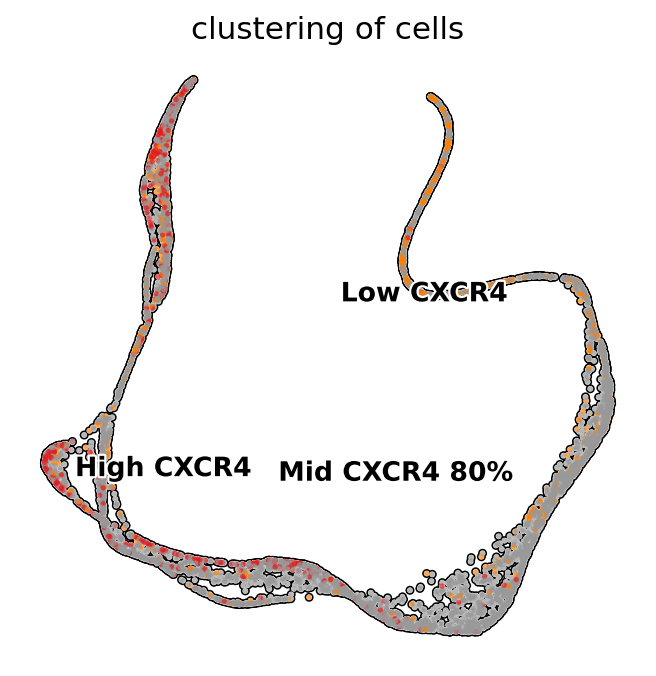

In [190]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.draw_graph(adatasubset, color='labels_CXCR4', add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette = 'Set1')

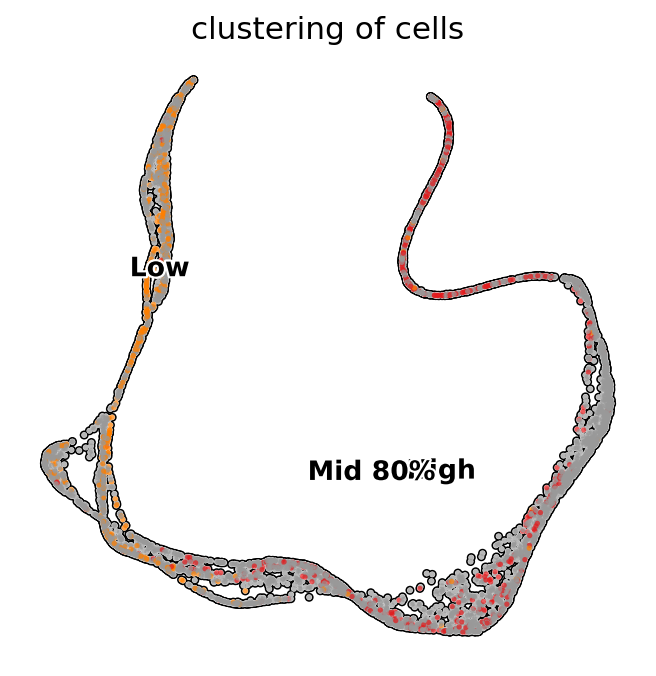

In [191]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.draw_graph(adatasubset, color='labels_GOBP_NEURON_MIGR', add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette = 'Set1')

In [246]:
def cluster_small_multiples_cartoon(
    adata, clust_key, size=40, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    with rc_context({'figure.figsize': (5, 5)}):
        sc.pl.draw_graph(
            tmp,
            groups=tmp.obs[clust].cat.categories[1:].values,
            color=adata.obs[clust_key].cat.categories.tolist(),
            size=size,
            add_outline=True,
            legend_fontsize=12, legend_fontoutline=2,
            frameon=True,
            legend_loc=legend_loc, outline_width = [0.6,0.1],
            **kwargs,
        )

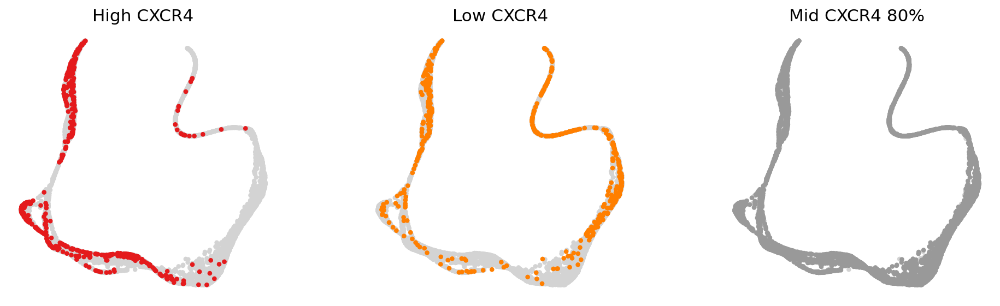

In [192]:
cluster_small_multiples(adatasubset, clust_key = 'labels_CXCR4')

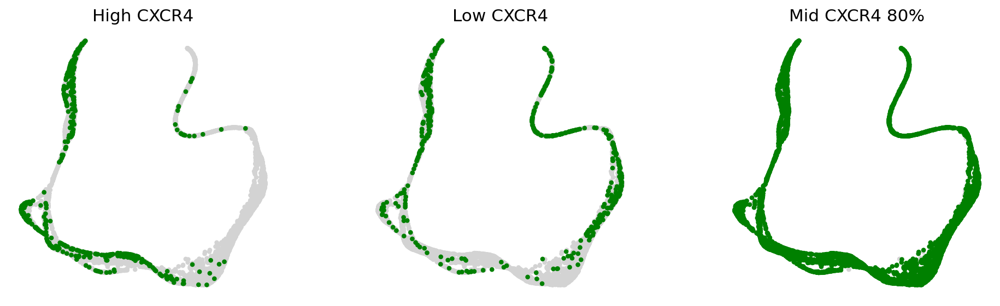

In [275]:
cluster_small_multiples(adatasubset, clust_key = 'labels_CXCR4', palette = ['Red','Green','Orange'])

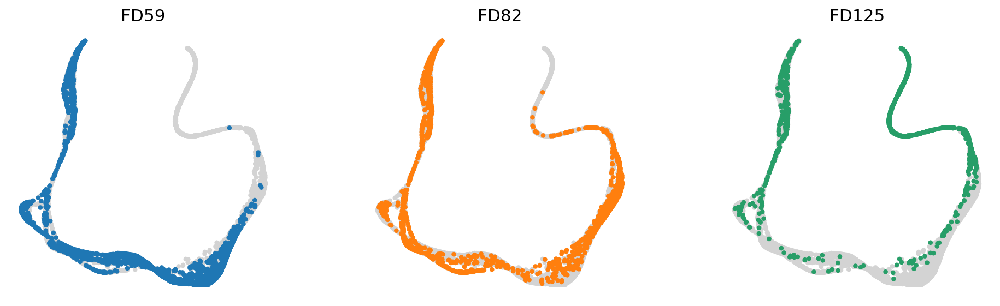

In [248]:
cluster_small_multiples(adatasubset, clust_key = 'stage')

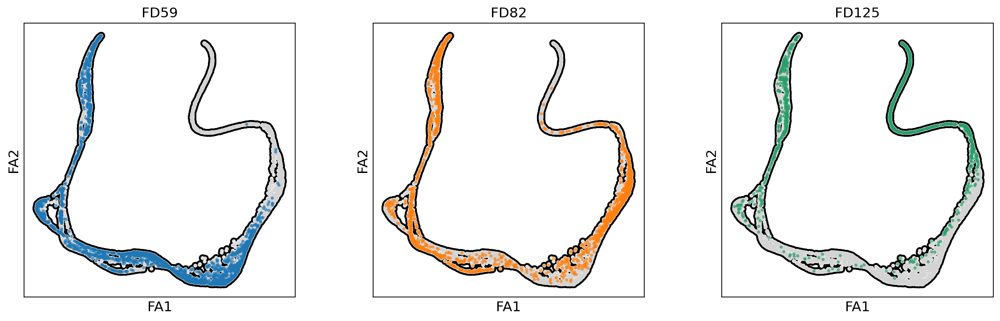

In [247]:
cluster_small_multiples_cartoon(adatasubset, clust_key = 'stage')

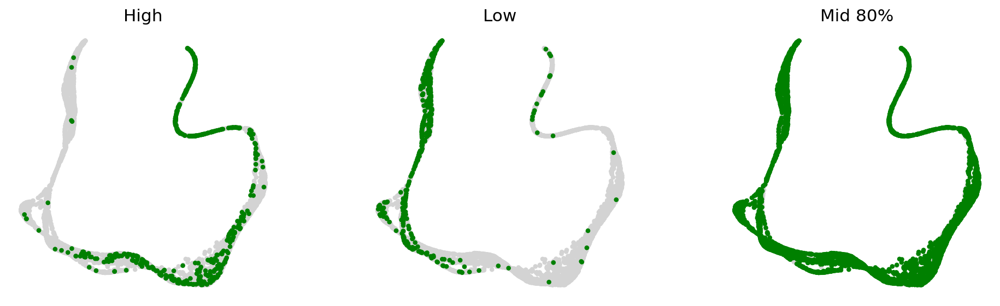

In [219]:
cluster_small_multiples(adatasubset, clust_key = 'labels_GOBP_NEURON_MIGR', palette = ['Red','Green','Orange'])

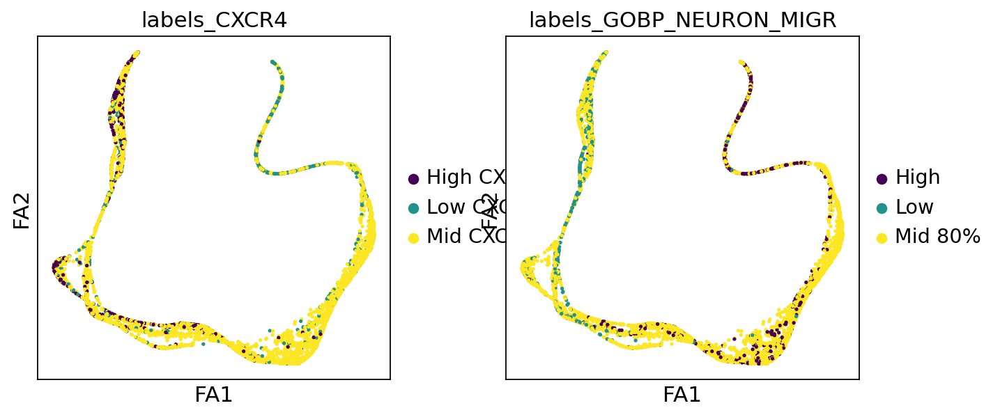

In [217]:
sc.pl.draw_graph(adatasubset,color=['labels_CXCR4','labels_GOBP_NEURON_MIGR'], palette = 'viridis')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:26)


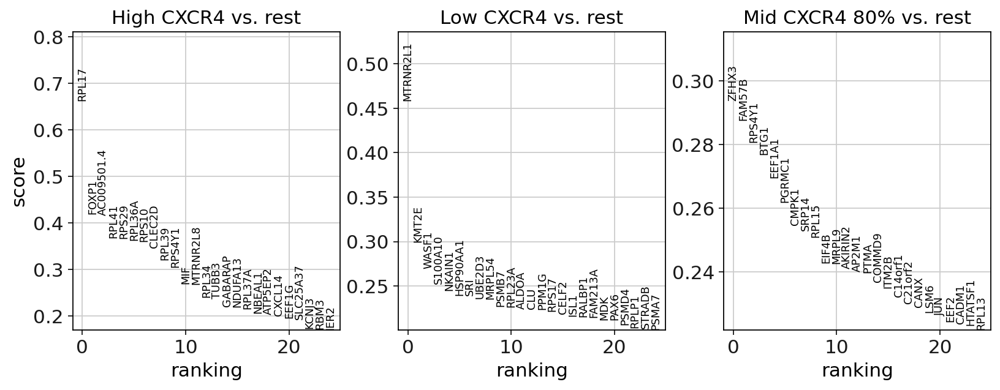

In [154]:
sc.set_figure_params()
sc.tl.rank_genes_groups(adatasubset, 'labels_CXCR4', method='logreg')
sc.pl.rank_genes_groups(adatasubset, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:24)


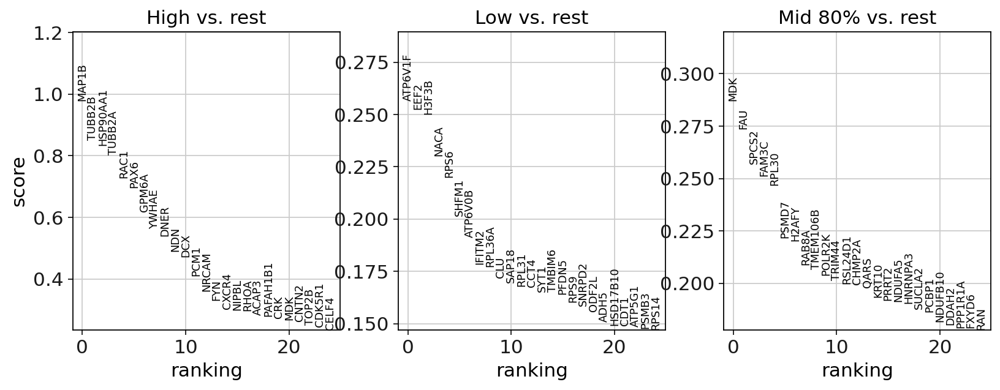

In [220]:
sc.set_figure_params()
sc.tl.rank_genes_groups(adatasubset, 'labels_GOBP_NEURON_MIGR', method='logreg')
sc.pl.rank_genes_groups(adatasubset, n_genes=25, sharey=False)

In [222]:
!pip install bioinfokit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.0/87.0 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for bioinfokit: filename=bioinfokit-2.1.0-py3-none-any.whl size=58665 sha256=ce4abdbee4cb62046e30c00f072e3e7ac6118ffddf01a387a21f848c6489763d
  Stored in directory: /home/mcrewcow/.cache/pip/wheels/25/ed/03/d043d6fbbf444c29aef08fe4e489c24dbc99d33fc7d3fe1514
  Created wheel for matplotlib-venn: filename=matplotlib_venn-0.11.9-py3-none-any.whl size=33000 sha256=dd451eca7ea3e480d8a422ac1c73a28dee14b4639abc93da0a37fb89c6cfcf28
  Stored in directory: /home/mcrewcow/.cache/pip/wheels/5c/c1/b7/a0a7bf26f902f0fe856bc1f8aedc3cf3aa755b67dad7f10989
Successfully built bioinfokit matplotlib-venn

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install 

In [228]:
sc.tl.umap(adatasubset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


In [229]:
sc.tl.tsne(adatasubset)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:34)


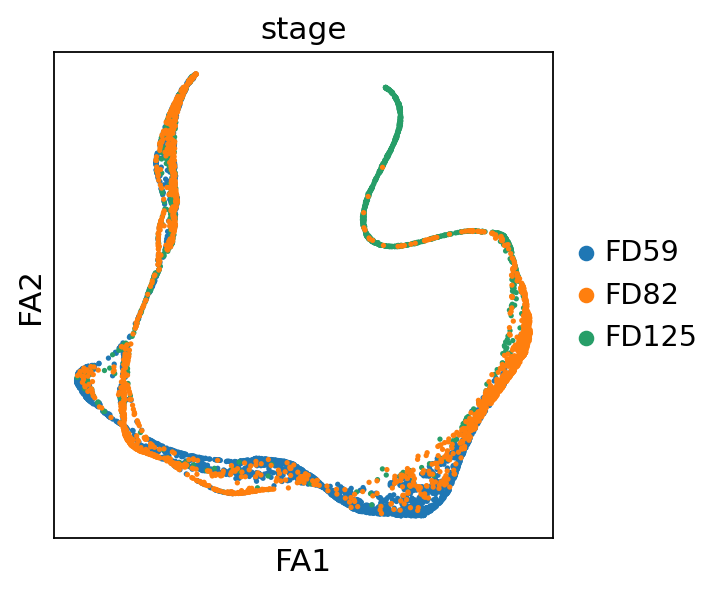

In [230]:
sc.pl.draw_graph(adatasubset,color=['stage'])

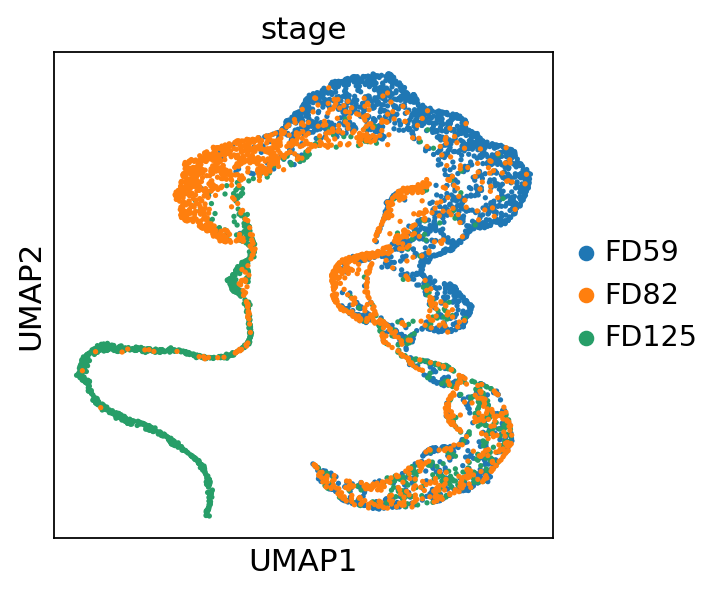

In [231]:
sc.pl.umap(adatasubset,color=['stage'])

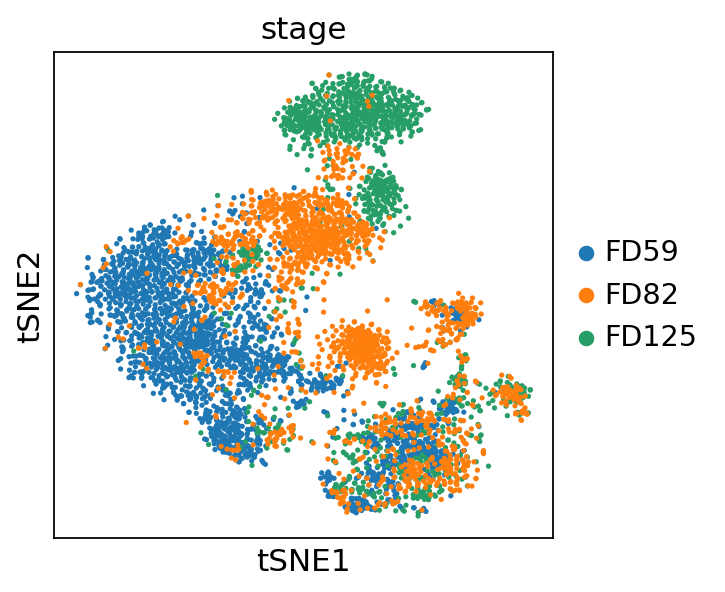

In [232]:
sc.pl.tsne(adatasubset,color=['stage'])

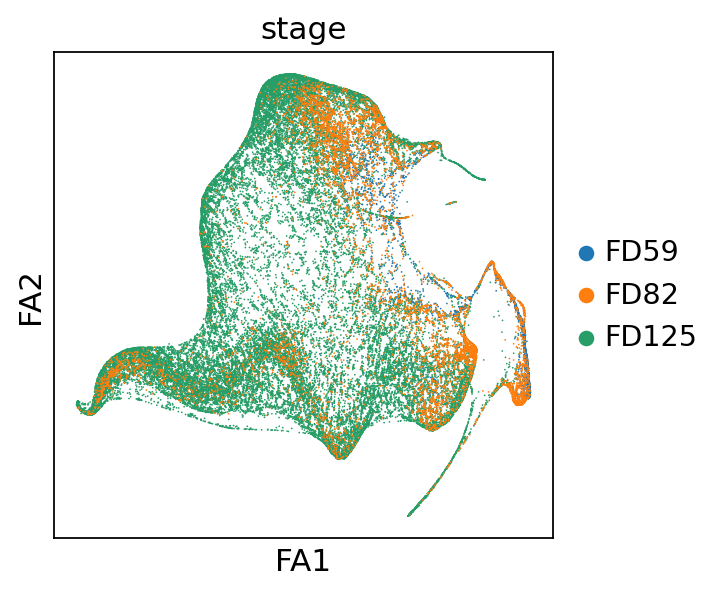

In [249]:
sc.pl.draw_graph(adata,color=['stage'])

In [250]:
adata.obs['CXCR4_labels'] = 'No'

In [251]:
adata.obs['CXCR4_labels'] = CXCR4['label']

In [252]:
adata.obs

,stage,batch,leiden,CXCR4_labels
AAACATACGAGGCA-1-0,FD59,0,12,NaN
AAACATACTTCCAT-1-0,FD59,0,38,Low CXCR4
AAACATACTTTCAC-1-0,FD59,0,38,Mid CXCR4 80%
AAACATTGACCTGA-1-0,FD59,0,24,High CXCR4
AAACCGTGAGAACA-1-0,FD59,0,47,NaN
...,...,...,...,...
TTTAGGCTTGCCTC-1-4,FD82,4,38,Mid CXCR4 80%
TTTAGGCTTTGACG-1-4,FD82,4,28,NaN
TTTATCCTTGCTCC-1-4,FD82,4,11,NaN
TTTCAGTGGCTTAG-1-4,FD82,4,24,Mid CXCR4 80%


In [253]:
adata.obs['GOBPMIGR_labels'] = 'No'

In [254]:
adata.obs

,stage,batch,leiden,CXCR4_labels,GOBPMIGR_labels
AAACATACGAGGCA-1-0,FD59,0,12,NaN,No
AAACATACTTCCAT-1-0,FD59,0,38,Low CXCR4,No
AAACATACTTTCAC-1-0,FD59,0,38,Mid CXCR4 80%,No
AAACATTGACCTGA-1-0,FD59,0,24,High CXCR4,No
AAACCGTGAGAACA-1-0,FD59,0,47,NaN,No
...,...,...,...,...,...
TTTAGGCTTGCCTC-1-4,FD82,4,38,Mid CXCR4 80%,No
TTTAGGCTTTGACG-1-4,FD82,4,28,NaN,No
TTTATCCTTGCTCC-1-4,FD82,4,11,NaN,No
TTTCAGTGGCTTAG-1-4,FD82,4,24,Mid CXCR4 80%,No


In [256]:
adata.obs['CXCR4_labels'] = GOBP_migration['label']

In [260]:
AnnData.write_h5ad(adata, '/mnt/c/Users/Emil/10X/R01sorting_adatatotal.h5ad')

In [261]:
AnnData.write_h5ad(adatasubset, '/mnt/c/Users/Emil/10X/R01sorting_adataRGCsubset.h5ad')

In [265]:
adatasubset

AnnData object with n_obs × n_vars = 5297 × 24264
    obs: 'stage', 'batch', 'leiden', 'GOBP_NEURON_MIGRATION', 'labels_CXCR4', 'labels_GOBP_NEURON_MIGR'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'stage_colors', 'leiden', 'leiden_colors', 'labels_CXCR4_colors', 'rank_genes_groups', 'labels_GOBP_NEURON_MIGR_colors', 'umap', 'tsne'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [272]:
adata.raw = adata

In [271]:
t=adatasubset.raw.X.toarray()

# comma separated csv with header, no rownames
pd.DataFrame(adatasubset.obs).to_csv("/mnt/c/Users/Emil/10X/R01sorting_adataRGCsubset_metadata.csv")

In [273]:
t=adata.raw.X.toarray()
pd.DataFrame(data=t, index=adata.obs_names, columns=adata.raw.var_names).to_csv('/mnt/c/Users/Emil/10X/R01sorting_adataRGCsubset_raw-counts.csv')
# comma separated csv with header, no rownames
pd.DataFrame(adata.obs).to_csv("/mnt/c/Users/Emil/10X/R01sorting_adataRGCsubset_metadata.csv")

In [274]:
adata

AnnData object with n_obs × n_vars = 50406 × 24264
    obs: 'stage', 'batch', 'leiden', 'CXCR4_labels', 'GOBPMIGR_labels'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'stage_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'